# Yoututbe Network Analysis

In [1]:
# Importing libraries
import random
import pandas as pd
import seaborn as sns
from matplotlib import cm
from tabulate import tabulate
import matplotlib.pyplot as plt

# networkx library for graph visualization
import networkx as nx
import community as community_louvain
# from networkx.algorithms import community

# Ignoring warnings
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("seaborn-v0_8")

# Setting aesthetic parameters for plots
sns.set_theme(style="whitegrid")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'

In [3]:
# Loading the dataset
CSV_FILE = '../Data/youtube_russiaukraine_cleaned.csv'
df = pd.read_csv(CSV_FILE)

In [4]:
print('Null values in the DataFrame:')
print(df.isnull().sum())
print()
df = df[df['clean_text_filtered'].notnull()]
print('\nNull values after filtering:')
df.isnull().sum()

Null values in the DataFrame:
videoId                    0
text                      16
title                  51079
description            51081
channelTitle           51079
videoPublishedAt       51079
tags                   51085
viewCount              51079
videoLikeCount         51080
videoCommentCount      51079
type                       0
commentId                175
author                   226
likeCount                175
publishedAt              175
parentId               32828
authorChannelId          175
processed_tokens           0
clean_text_filtered     2849
sentiment_score            0
sentiment                  0
date                     175
dtype: int64


Null values after filtering:


videoId                    0
text                       0
title                  48230
description            48232
channelTitle           48230
videoPublishedAt       48230
tags                   48236
viewCount              48230
videoLikeCount         48231
videoCommentCount      48230
type                       0
commentId                175
author                   224
likeCount                175
publishedAt              175
parentId               31319
authorChannelId          175
processed_tokens           0
clean_text_filtered        0
sentiment_score            0
sentiment                  0
date                     175
dtype: int64

In [5]:
print(f'Shape of the DataFrame: {df.shape}')

Shape of the DataFrame: (48405, 22)


In [6]:
df.head(5)

,videoId,text,title,description,channelTitle,videoPublishedAt,tags,viewCount,videoLikeCount,videoCommentCount,...,author,likeCount,publishedAt,parentId,authorChannelId,processed_tokens,clean_text_filtered,sentiment_score,sentiment,date
0,x_DyyPMaVR0,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,"In Ukraine, swarms of Russian drones filled th...",Channel 4 News,2025-05-26 17:50:04+00:00,Russia;Ukraine;Turkey;Ankara;Russia Ukraine Wa...,62099.0,544.0,455.0,...,NaN,NaN,NaN,NaN,NaN,"['trump', 'call', 'putin', 'crazi', 'largest',...",trump call putin crazi largest air attack war ...,-0.9735,Negative,NaN
1,x_DyyPMaVR0,Yet no mention of the fact that in the recent ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,@richieboy1971,0.0,2025-05-27 04:41:25+00:00,NaN,UCqaL9sb-wqAKneSzwju92OA,"['yet', 'mention', 'fact', 'recent', 'negoti',...",yet mention fact recent negoti prison swap ukr...,-0.7269,Negative,2025-05-27 04:41:25+00:00
2,x_DyyPMaVR0,Trump talks a lot but none of it ever transfor...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,@Turtle_Zed,0.0,2025-05-27 04:34:40+00:00,NaN,UCNImr4HOMoOBjb3Y0MUW-Uw,"['trump', 'talk', 'lot', 'none', 'ever', 'tran...",trump talk lot none ever transform action frie...,0.4939,Positive,2025-05-27 04:34:40+00:00
3,x_DyyPMaVR0,Haaha the russian bots are terrified. Just bas...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,@Vykandar,0.0,2025-05-27 04:30:09+00:00,NaN,UC92JUclfl0YcAqK4xlpRc_w,"['russian', 'bot', 'terrifi', 'base', 'comment...",russian bot terrifi base comment section tell ...,0.0000,Neutral,2025-05-27 04:30:09+00:00
4,x_DyyPMaVR0,send the troops president trump,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,@stmartinshirt,0.0,2025-05-27 04:29:53+00:00,NaN,UC_hAirOy_3qohESaQ0P6ttg,"['send', 'troop', 'presid', 'trump']",send troop presid trump,0.0000,Neutral,2025-05-27 04:29:53+00:00


In [7]:
print('\nData types of the DataFrame:')
df.dtypes


Data types of the DataFrame:


videoId                 object
text                    object
title                   object
description             object
channelTitle            object
videoPublishedAt        object
tags                    object
viewCount              float64
videoLikeCount         float64
videoCommentCount      float64
type                    object
commentId               object
author                  object
likeCount              float64
publishedAt             object
parentId                object
authorChannelId         object
processed_tokens        object
clean_text_filtered     object
sentiment_score        float64
sentiment               object
date                    object
dtype: object

## Graph Creation of YouTube Network Analysis

In [8]:
# Checking for null values in the DataFrame
df = df[df['clean_text_filtered'].notna()]
df['parentId'] = df['parentId'].astype(str, errors='ignore')

# Building commentId → author mapping
id_to_author = df.set_index('commentId')['author'].to_dict()

# Filtering to only true replies (parentId in our commentId map)
replies = df.dropna(subset=['parentId']).copy()
replies = replies[replies['parentId'].isin(id_to_author)]

# Excluding deleted/system accounts
bad_users = {'[deleted]', '', 'AutoModerator'}
replies = replies[~replies['author'].isin(bad_users)]
replies = replies[replies['author'] != replies['parentId'].map(id_to_author)]

# Building weighted DiGraph
G = nx.DiGraph()
for _, row in replies.iterrows():
    src = row['author']
    tgt = id_to_author[row['parentId']]
    if G.has_edge(src, tgt):
        G[src][tgt]['weight'] += 1
    else:
        G.add_edge(src, tgt, weight=1)

# Quick summary
avg_degree = sum(dict(G.degree()).values()) / G.number_of_nodes()
print(f"Number of Nodes                         : {G.number_of_nodes()}")
print(f"Number of Edges                         : {G.number_of_edges()}")
print(f"Average Degree                          : {avg_degree:.2f}")
print(f"Number of Isolated Nodes                : {len(list(nx.isolates(G)))}")
print(f"Number of Strongly Connected Components : {nx.number_strongly_connected_components(G)}")
print(f"Number of Weakly Connected Components   : {nx.number_weakly_connected_components(G)}")
print(f"Number of Connected Components          : {nx.number_connected_components(G.to_undirected())}")


Number of Nodes                         : 8756
Number of Edges                         : 10079
Average Degree                          : 2.30
Number of Isolated Nodes                : 0
Number of Strongly Connected Components : 8753
Number of Weakly Connected Components   : 552
Number of Connected Components          : 552


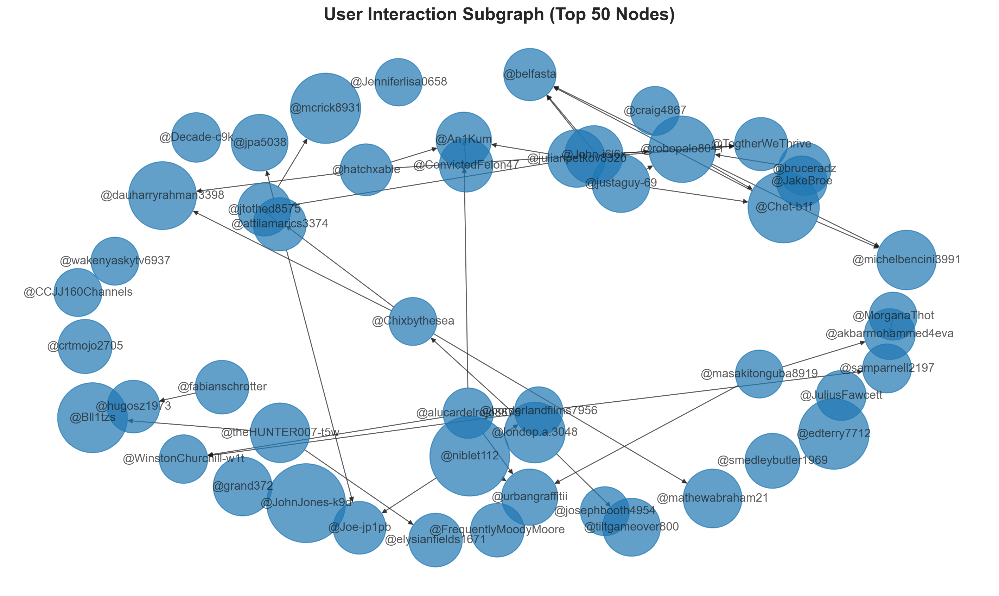

In [9]:
# User Interaction Top 50 nodes by degree
deg_dict = dict(G.degree(weight='weight'))
top50 = sorted(deg_dict, key=deg_dict.get, reverse=True)[:50]
G_sub = G.subgraph(top50).copy()
pos = nx.spring_layout(G_sub, k=0.5)  # tweak k for more/less spacing
nx.draw(
    G_sub,
    pos,
    with_labels=True,
    node_size=[deg_dict[n] * 50 for n in G_sub.nodes()],  # scale sizes by degree
    alpha=0.7,
    font_size=12
)
plt.title("User Interaction Subgraph (Top 50 Nodes)")
plt.tight_layout()
plt.show()

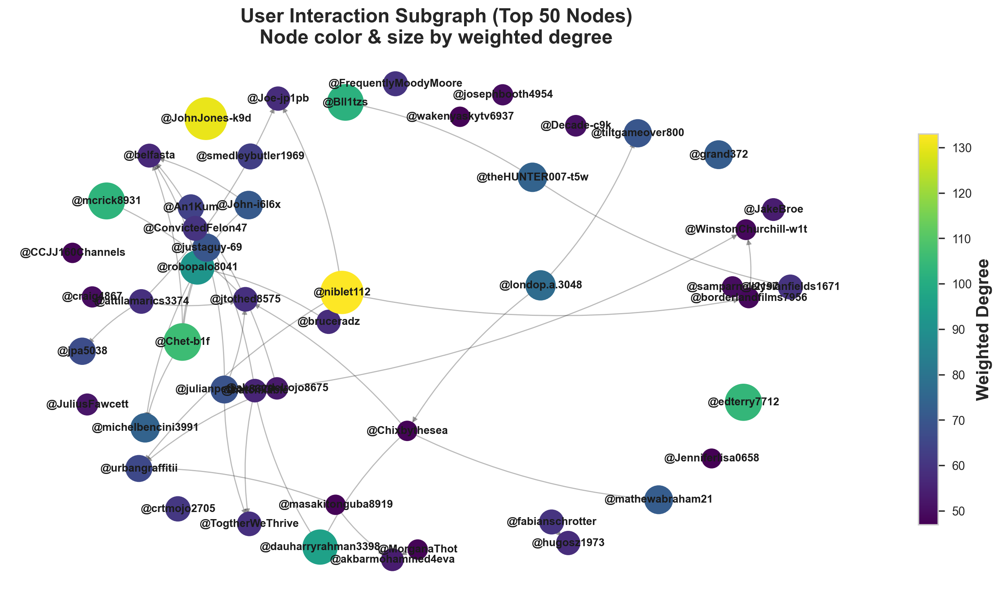

In [10]:
# User Interaction Top 50 nodes by degree with better visualization
deg_dict = dict(G.degree(weight='weight'))
top50 = sorted(deg_dict, key=deg_dict.get, reverse=True)[:50]
G_sub = G.subgraph(top50).copy()

degrees = [deg_dict[n] for n in G_sub.nodes()]
vmin, vmax = min(degrees), max(degrees)
norm = plt.Normalize(vmin, vmax)
cmap = plt.cm.viridis

node_colors = [cmap(norm(deg_dict[n])) for n in G_sub.nodes()]
node_sizes = [300 + (deg_dict[n] - vmin) / (vmax - vmin) * 1200 for n in G_sub.nodes()]

pos = nx.spring_layout(G_sub, k=0.5, seed=42)
fig, ax = plt.subplots(figsize=(14, 8))
       
nx.draw_networkx_edges(G_sub, pos, ax=ax, alpha=0.3, width=1, connectionstyle='arc3,rad=0.1' ) 
nx.draw_networkx_nodes(G_sub, pos, ax=ax,
                       node_color=node_colors,
                       node_size=node_sizes)

all = sorted(deg_dict, key=deg_dict.get, reverse=True)
labels = {n: n for n in G_sub.nodes() if n in all}
nx.draw_networkx_labels(G_sub, pos, labels, font_size=10, font_weight='bold', ax=ax)
ax.set_axis_off()
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(degrees)
cbar = fig.colorbar(sm, ax=ax, shrink=0.7)
cbar.set_label('Weighted Degree')
plt.title("User Interaction Subgraph (Top 50 Nodes)\nNode color & size by weighted degree")
plt.tight_layout()
plt.show()


### Statistics of the YouTube Network with Visualization

In [11]:
# Calculating standard metrics
metrics_full = {
    'In-Degree': dict(G.in_degree()),
    'Out-Degree': dict(G.out_degree()),
    'Degree Centrality': nx.degree_centrality(G),
    'Eigenvector Centrality': nx.eigenvector_centrality(G, max_iter=1000),
    'Closeness Centrality': nx.closeness_centrality(G),
    'Katz Centrality': nx.katz_centrality(G),
}
metrics_df_full = pd.DataFrame(metrics_full)
summary_full = metrics_df_full.describe().rename(index={
    "count": "Count", "mean": "Mean", "std": "Std. Dev", "min": "Min",
    "25%": "25th Percentile", "50%": "50th Percentile",
    "75%": "75th Percentile", "max": "Max"
})

In [12]:
print("\n=== Summary: Full Graph ===")
print(tabulate(summary_full, headers='keys', tablefmt='grid', floatfmt=".4f"))


=== Summary: Full Graph ===
+-----------------+-------------+--------------+---------------------+--------------------------+------------------------+-------------------+
|                 |   In-Degree |   Out-Degree |   Degree Centrality |   Eigenvector Centrality |   Closeness Centrality |   Katz Centrality |
+=================+=============+==============+=====================+==========================+========================+===================+
| Count           |   8756.0000 |    8756.0000 |           8756.0000 |                8756.0000 |              8756.0000 |         8756.0000 |
+-----------------+-------------+--------------+---------------------+--------------------------+------------------------+-------------------+
| Mean            |      1.1511 |       1.1511 |              0.0003 |                   0.0008 |                 0.0002 |            0.0103 |
+-----------------+-------------+--------------+---------------------+--------------------------+----------------

In [13]:
summary_full

,In-Degree,Out-Degree,Degree Centrality,Eigenvector Centrality,Closeness Centrality,Katz Centrality
Count,8756.000000,8756.000000,8756.000000,8.756000e+03,8756.000000,8756.000000
Mean,1.151096,1.151096,0.000263,7.977334e-04,0.000161,0.010268
Std. Dev,3.089990,2.440686,0.000426,1.065758e-02,0.000442,0.002962
Min,0.000000,0.000000,0.000114,6.676654e-11,0.000000,0.009163
25th Percentile,0.000000,0.000000,0.000114,6.676654e-11,0.000000,0.009163
50th Percentile,0.000000,1.000000,0.000114,6.676654e-11,0.000000,0.009163
75th Percentile,1.000000,1.000000,0.000228,2.002996e-09,0.000114,0.010079
Max,52.000000,91.000000,0.010394,3.405276e-01,0.006597,0.057766


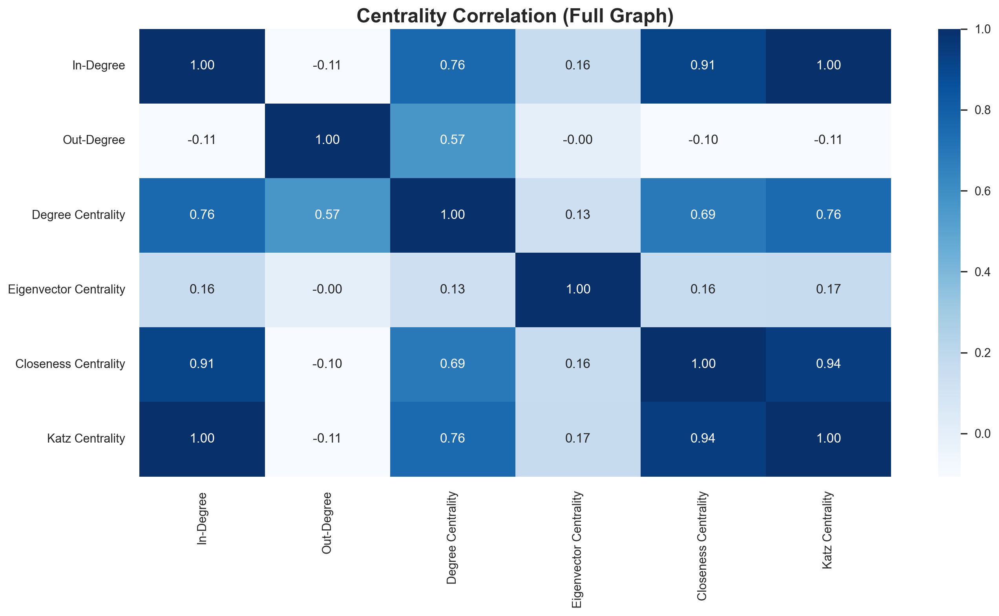

In [14]:
# Coorrelation heatmap for full graph metrics
corr = metrics_df_full.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="Blues")
plt.title("Centrality Correlation (Full Graph)")
plt.tight_layout()
plt.show()

In [15]:
# Selecting top 50 nodes by degree for metrics
deg_dict = dict(G.degree(weight='weight'))
top50 = sorted(deg_dict, key=lambda node: deg_dict[node], reverse=True)[:50]
metrics_df_top50 = metrics_df_full.loc[top50]
summary_top50 = metrics_df_top50.describe().rename(index={
    "count": "Count",
    "mean": "Mean",
    "std": "Std. Dev",
    "min": "Min",
    "25%": "25th Percentile",
    "50%": "50th Percentile",
    "75%": "75th Percentile",
    "max": "Max"
})


In [16]:
print("\n=== Summary: Full Graph ===")
print(tabulate(summary_top50, headers='keys', tablefmt='grid', floatfmt=".4f"))


=== Summary: Full Graph ===
+-----------------+-------------+--------------+---------------------+--------------------------+------------------------+-------------------+
|                 |   In-Degree |   Out-Degree |   Degree Centrality |   Eigenvector Centrality |   Closeness Centrality |   Katz Centrality |
+=================+=============+==============+=====================+==========================+========================+===================+
| Count           |     50.0000 |      50.0000 |             50.0000 |                  50.0000 |                50.0000 |           50.0000 |
+-----------------+-------------+--------------+---------------------+--------------------------+------------------------+-------------------+
| Mean            |     16.4800 |      11.6200 |              0.0032 |                   0.0115 |                 0.0022 |            0.0251 |
+-----------------+-------------+--------------+---------------------+--------------------------+----------------

In [17]:
summary_top50

,In-Degree,Out-Degree,Degree Centrality,Eigenvector Centrality,Closeness Centrality,Katz Centrality
Count,50.000000,50.000000,50.000000,5.000000e+01,50.000000,50.000000
Mean,16.480000,11.620000,0.003210,1.148322e-02,0.002211,0.025098
Std. Dev,15.731471,20.623832,0.002062,3.928947e-02,0.001982,0.014876
Min,0.000000,0.000000,0.000571,6.676654e-11,0.000000,0.009163
25th Percentile,0.250000,0.000000,0.001828,5.508240e-10,0.000029,0.009392
50th Percentile,14.500000,1.000000,0.002684,1.433478e-07,0.001933,0.023761
75th Percentile,28.750000,15.500000,0.004055,1.235321e-05,0.003686,0.036275
Max,52.000000,91.000000,0.010394,1.433834e-01,0.006597,0.057766


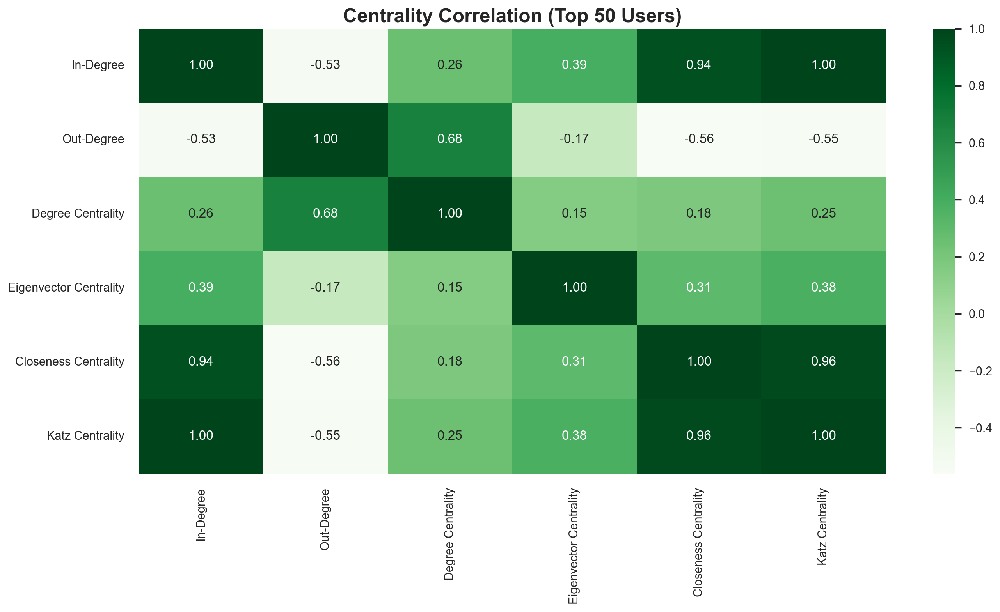

In [18]:
# Coorrelation heatmap for top 50 nodes metrics
corr = metrics_df_top50.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="Greens")
plt.title("Centrality Correlation (Top 50 Users)")
plt.tight_layout()
plt.show()


### 1-Degree and 2-Degree Neighbors of the Node with highest likes

Node of interest: @grand372 (Comment liked 857.0 times)
Comment text: putin front line start


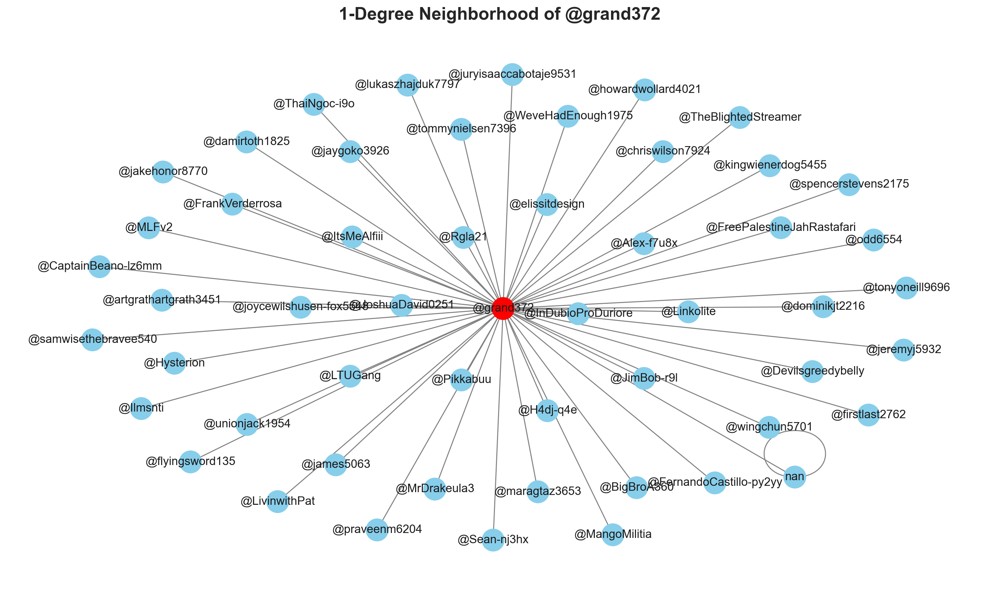

In [19]:
# 1-Degree Neighborhood
# Define your node of interest based on the maximum likes
like_col = 'likeCount'  
max_like_idx = df[like_col].idxmax()
max_row = df.loc[max_like_idx]

# Get details of the node of interest
node_of_interest = max_row['author']
print(f"Node of interest: {node_of_interest} (Comment liked {max_row[like_col]} times)")
print(f"Comment text: {max_row['clean_text_filtered']}")

# Create an undirected version of the graph for neighborhood analysis
G_und = G.to_undirected()

# Compute 1-hop neighbors
lengths_1 = nx.single_source_shortest_path_length(G_und, node_of_interest, cutoff=1)
one_hop = {n for n, d in lengths_1.items() if d == 1}

# Build subgraph for 1-degree
G1 = G_und.subgraph({node_of_interest} | one_hop).copy()

# Layout and plot
pos1 = nx.spring_layout(G1, seed=42)
nx.draw(
    G1,
    pos=pos1,
    with_labels=True,
    node_size=500,
    node_color=['red' if n == node_of_interest else 'skyblue' for n in G1.nodes()],
    edge_color='gray'
)
plt.title(f"1-Degree Neighborhood of {node_of_interest}")
plt.tight_layout()
plt.show()


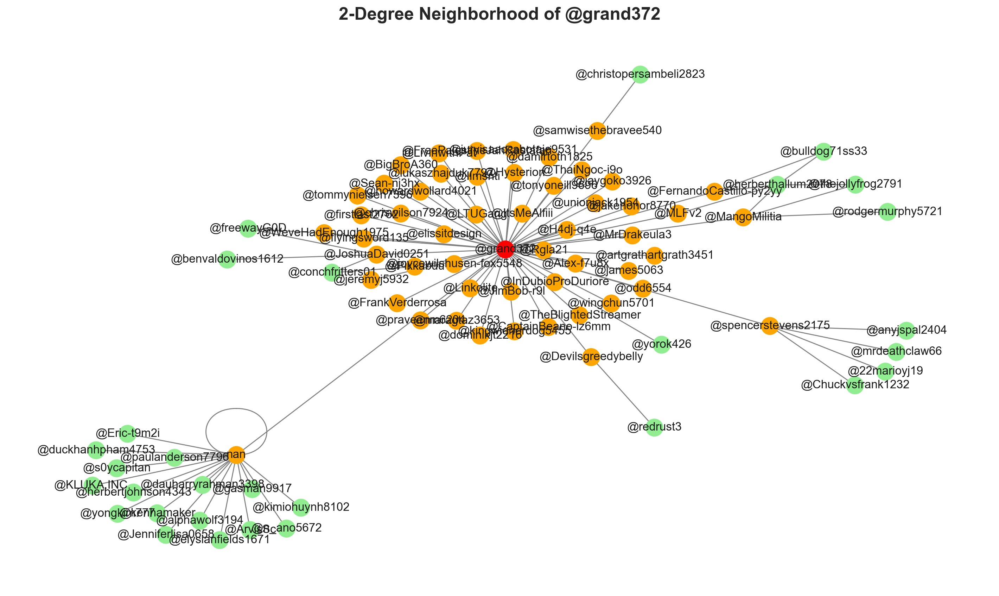

In [20]:
# 2-Degree Neighborhood
# Compute 2-hop neighbors
lengths_2 = nx.single_source_shortest_path_length(G_und, node_of_interest, cutoff=2)
two_hop = {n for n, d in lengths_2.items() if d == 2}

# Build subgraph for 2-degree
G2 = G_und.subgraph({node_of_interest} | one_hop | two_hop).copy()

# Layout and plot (reuse positions)
pos2 = nx.spring_layout(G2, seed=42)
nx.draw(
    G2,
    pos=pos2,
    with_labels=True,
    node_size=300,
    node_color=[
        'red' if n == node_of_interest 
        else ('orange' if n in one_hop else 'lightgreen') 
        for n in G2.nodes()
    ],
    edge_color='gray'
)
plt.title(f"2-Degree Neighborhood of {node_of_interest}")
plt.tight_layout()
plt.show()


## Community Detection (Louvain Method and Partition Method)

### Community Detection of the YouTube Network (full graph)

In [21]:
# Extracting communities using Louvain and Label Propagation
partition_louvain = community_louvain.best_partition(G_und)
communities_lp = list(nx.algorithms.community.label_propagation_communities(G_und))
partition_lp = {n: cid for cid, comm in enumerate(communities_lp) for n in comm}

# Calculating modularity for both methods
mod_louv = community_louvain.modularity(partition_louvain, G_und)
mod_lp   = nx.algorithms.community.quality.modularity(G_und, [list(c) for c in communities_lp])

print(f"Louvain           : {len(set(partition_louvain.values()))} communities, modularity={mod_louv:.4f}")
print(f"Label Propagation : {len(communities_lp)} communities, modularity={mod_lp:.4f}")

Louvain           : 600 communities, modularity=0.8948
Label Propagation : 2023 communities, modularity=0.6297


In [22]:
# Computing layout once for consistency
pos = nx.spring_layout(G, seed=42)

In [23]:
# Function to plot communities
def plot_community(G, partition, title, pos):
    cmap = cm.get_cmap('tab20')
    nodes = list(G.nodes())
    colors = [cmap(partition[n] % 20) for n in nodes]
    nx.draw_networkx(
        G,
        pos=pos,
        node_color=colors,
        with_labels=False,
        node_size=50,
        edge_color='lightgray',
        linewidths=0.5
    )
    plt.title(title)
    plt.axis('off')
    plt.show()

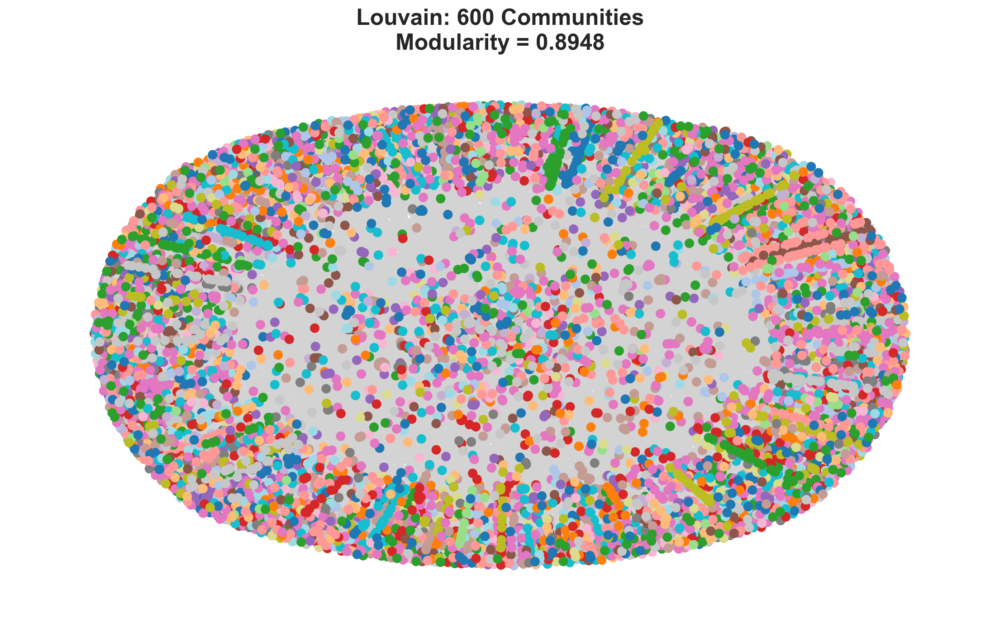

In [24]:
# Plot Louvain communities
plot_community(
    G,
    partition_louvain,
    f"Louvain: {len(set(partition_louvain.values()))} Communities\nModularity = {mod_louv:.4f}",
    pos
)

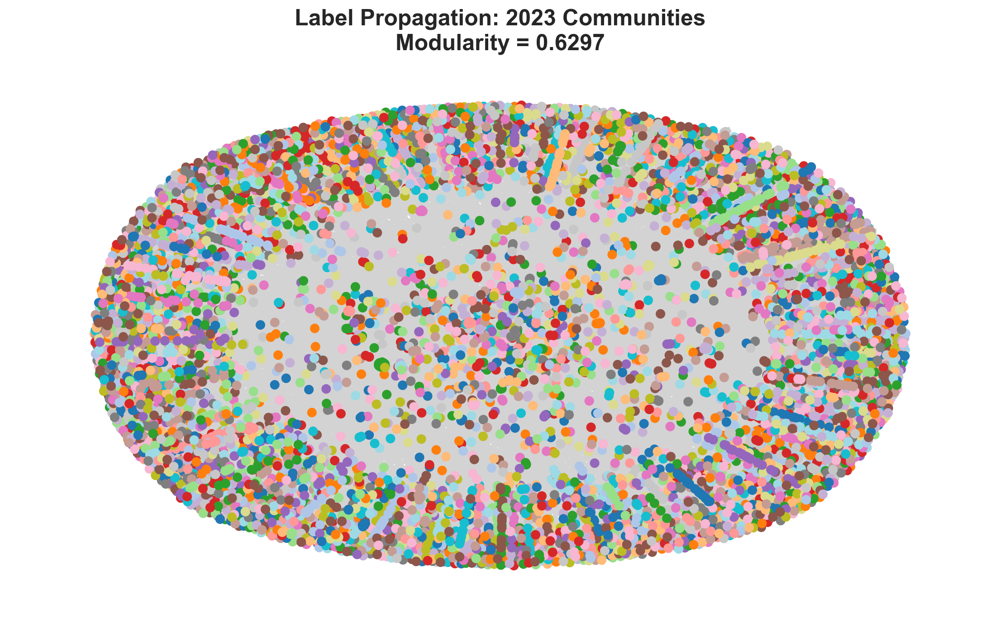

In [25]:
# Plot Label Propagation communities
plot_community(
    G,
    partition_lp,
    f"Label Propagation: {len(communities_lp)} Communities\nModularity = {mod_lp:.4f}",
    pos
)

### Community Detection of the YouTube Network (Top 50 Nodes)

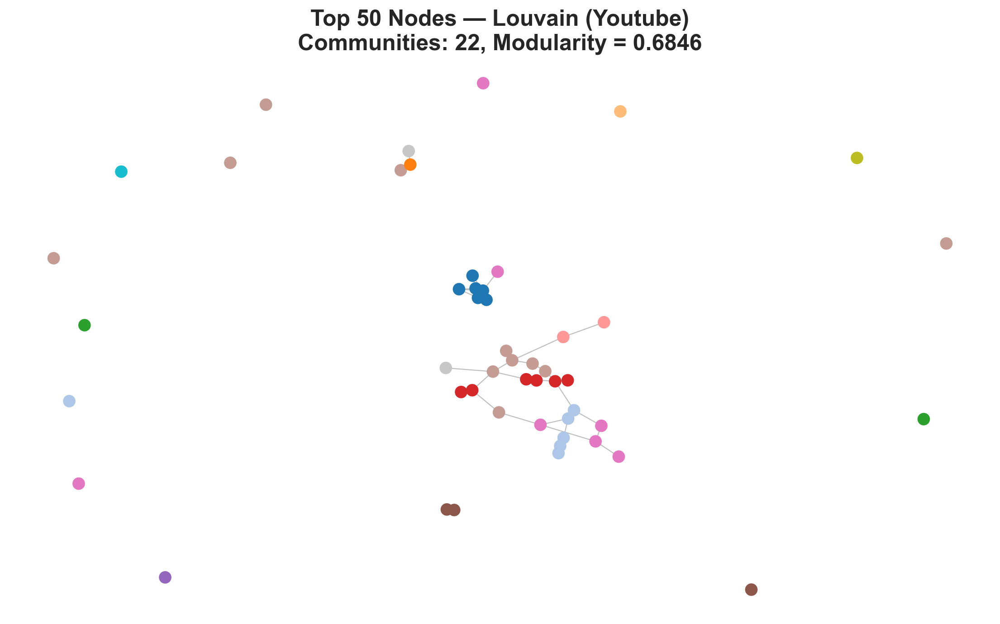

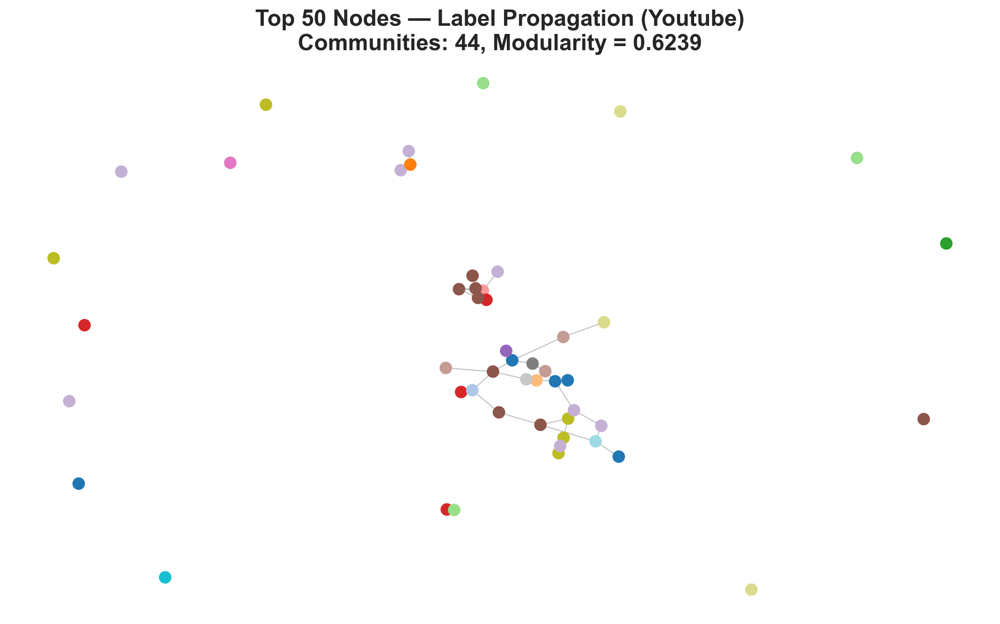

In [37]:
# Filtering to top 50 nodes for subgraph analysis
G_sub_top50 = G.subgraph(top50).copy()
G_und_sub = G_sub_top50.to_undirected()
part_louv_sub = {n: partition_louvain[n] for n in G_und_sub.nodes()}
part_lp_sub = {n: partition_lp[n] for n in G_und_sub.nodes()}

# Compute modularity for subgraphs
mod_louv_sub = community_louvain.modularity(part_louv_sub, G_und_sub)
mod_lp_sub = nx.algorithms.community.quality.modularity(
    G_und_sub,
    [list(c & set(G_und_sub.nodes())) for c in communities_lp]
)

# Define plotting function
def plot_community_top50(G, partition, title):
    pos = nx.spring_layout(G, seed=42)
    cmap = cm.get_cmap('tab20')
    colors = [cmap(partition[n] % 20) for n in G.nodes()]
    nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5, width=0.8, connectionstyle='arc3,rad=0.1' ) 
    nx.draw_networkx_nodes(G, pos, node_color=colors, node_size=80)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Plot Louvain for top50
plot_community_top50(
    G_und_sub,
    part_louv_sub,
    f"Top 50 Nodes — Louvain (Youtube)\nCommunities: {len(set(part_louv_sub.values()))}, Modularity = {mod_louv_sub:.4f}"
)

# Plot Label Propagation for top50
plot_community_top50(
    G_und_sub,
    part_lp_sub,
    f"Top 50 Nodes — Label Propagation (Youtube)\nCommunities: {len(set(part_lp_sub.values()))}, Modularity = {mod_lp_sub:.4f}"
)


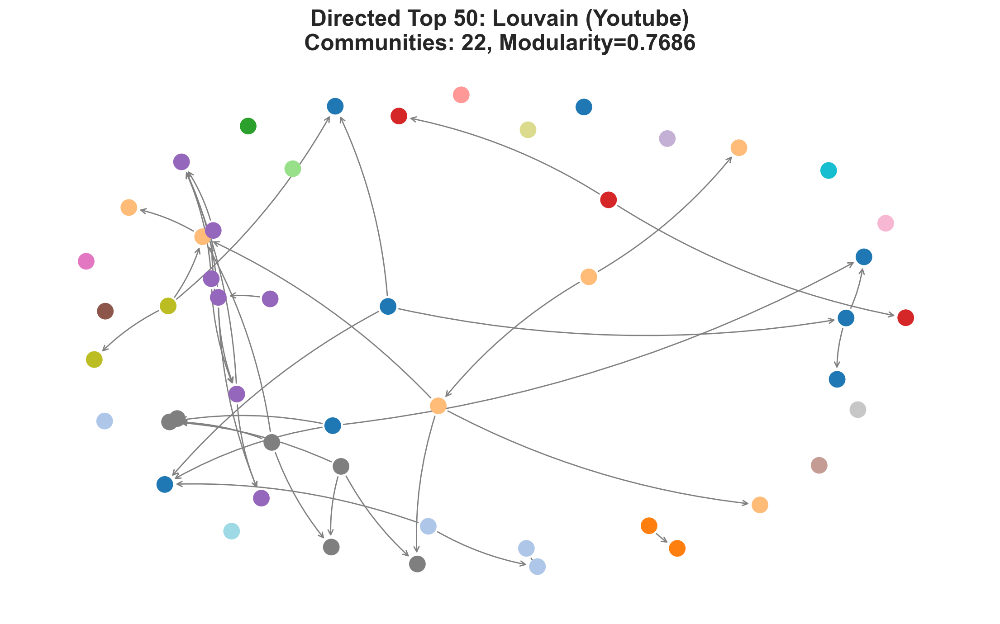

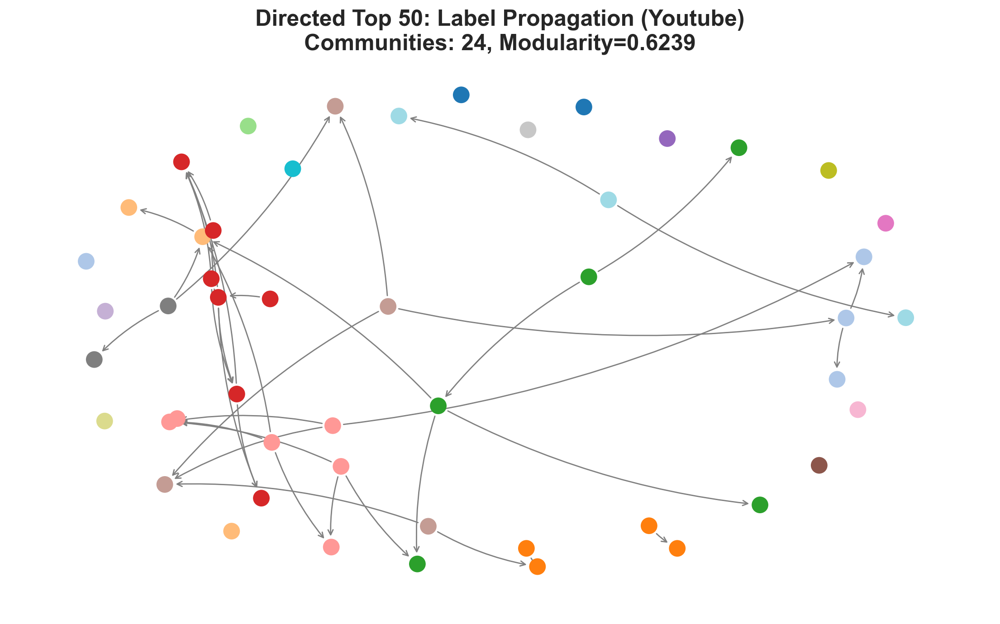

In [41]:
G_sub = G.subgraph(top50).copy()
G_und_sub = G_sub.to_undirected()

# Louvain
part_louv_sub = community_louvain.best_partition(G_und_sub)
mod_louv_sub  = community_louvain.modularity(part_louv_sub, G_und_sub)

# Label Propagation
communities_lp = list(nx.community.label_propagation_communities(G_und_sub))
part_lp_sub    = {n: cid for cid, comm in enumerate(communities_lp) for n in comm}
mod_lp_sub     = nx.community.quality.modularity(G_und_sub,
                                  [list(c & set(G_und_sub.nodes())) for c in communities_lp])

def plot_community_directed(Gd, partition, title, arrow_size=10, width=1.0):
    pos = nx.spring_layout(Gd, seed=42)
    cmap = cm.get_cmap('tab20')
    colors = [cmap(partition[n] % 20) for n in Gd.nodes()]

    nx.draw_networkx_edges(
        Gd, pos,
        arrowstyle='->',
        arrowsize=arrow_size,
        edge_color='gray',
        width=width,
        connectionstyle='arc3,rad=0.1'  
    )

    nx.draw_networkx_nodes(
        Gd, pos,
        node_color=colors,
        node_size=150
    )
    plt.title(title)
    plt.axis('off')
    plt.show()

# Plot directed Louvain & LP communities ---
plot_community_directed(
    G_sub, part_louv_sub,
    f"Directed Top 50: Louvain (Youtube)\nCommunities: {len(set(part_louv_sub.values()))}, Modularity={mod_louv_sub:.4f}"
)

plot_community_directed(
    G_sub, part_lp_sub,
    f"Directed Top 50: Label Propagation (Youtube)\nCommunities: {len(communities_lp)}, Modularity={mod_lp_sub:.4f}"
)

## Independent Cascade Model

In [28]:
# Function to calculate and plot cascade steps
def run_independent_cascade(G, seed_node, p=0.05, max_steps=10):
    UG = G.to_undirected()
    active = set([seed_node])
    newly_active = set([seed_node])
    cascade_edges = []
    steps = [1]

    cascade_graph = nx.DiGraph()
    cascade_graph.add_node(seed_node)

    for _ in range(max_steps):
        next_newly_active = set()
        for node in newly_active:
            for neighbor in UG.neighbors(node):
                if neighbor not in active and random.random() <= p:
                    next_newly_active.add(neighbor)
                    cascade_edges.append((node, neighbor))
        if not next_newly_active:
            break
        newly_active = next_newly_active
        active.update(newly_active)
        steps.append(len(active))

    cascade_graph.add_edges_from(cascade_edges)
    return steps, cascade_graph

In [29]:
random_node = random.choice(list(G.nodes()))
high_central_node = metrics_df_full['Degree Centrality'].idxmax()
high_closeness_node = metrics_df_full['Closeness Centrality'].idxmax()

In [30]:
print("Seed Users:")
print("Random Node:", random_node)
print("Top Likes Node:", node_of_interest)
print("High Centrality:", high_central_node)
print("High Closeness:", high_closeness_node)

Seed Users:
Random Node: @islamhoquehc
Top Likes Node: @grand372
High Centrality: @edterry7712
High Closeness: @mcrick8931


In [39]:
strategies = {
    'Random Node': random_node,
    'Top Likes Node': node_of_interest,
    'High Centrality': high_central_node,
    # 'High Closeness': high_closeness_node
}

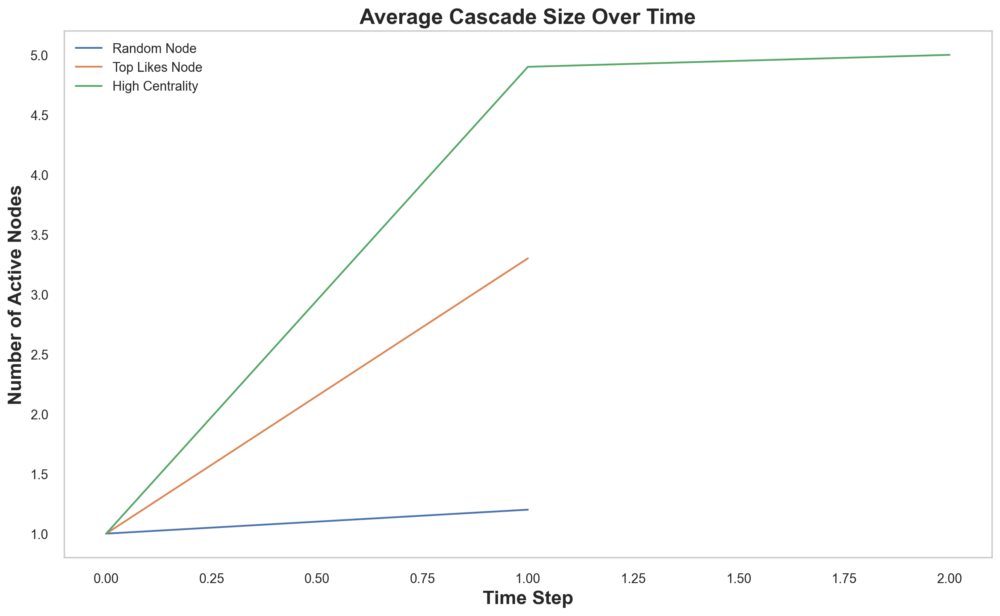

In [40]:
for label, seed in strategies.items():
    all_steps = []
    for _ in range(10):
        try:
            steps, _ = run_independent_cascade(G, seed, p=0.05, max_steps=10)
            all_steps.append(steps)
        except Exception as e:
            print(f"Error for {label} seed {seed}: {e}")
            continue
    if not all_steps:
        continue
    max_len = max(len(run) for run in all_steps)
    padded_runs = [run + [run[-1]] * (max_len - len(run)) for run in all_steps]
    avg_run = [sum(col) / len(col) for col in zip(*padded_runs)]
    plt.plot(avg_run, label=label)
plt.title("Average Cascade Size Over Time")
plt.xlabel("Time Step")
plt.ylabel("Number of Active Nodes")
plt.legend()
plt.grid()
plt.show()


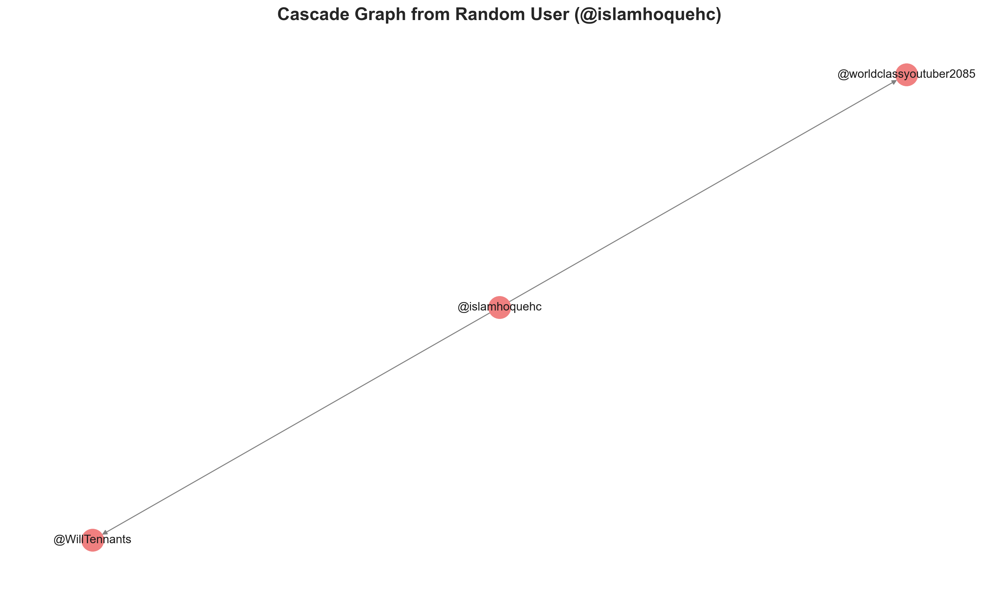

In [33]:
# Random seed cascade
steps, cascade_g_random = run_independent_cascade(G, random_node, p=0.5, max_steps=10)
if isinstance(cascade_g_random, nx.Graph) and cascade_g_random.number_of_nodes() > 0:
    pos = nx.spring_layout(cascade_g_random, seed=42)
    nx.draw(cascade_g_random, pos, with_labels=True, node_size=500, node_color='lightcoral', edge_color='gray', arrows=True)
    plt.title(f"Cascade Graph from Random User ({random_node})")
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Cascade graph is empty — no further spread from Random seed.")


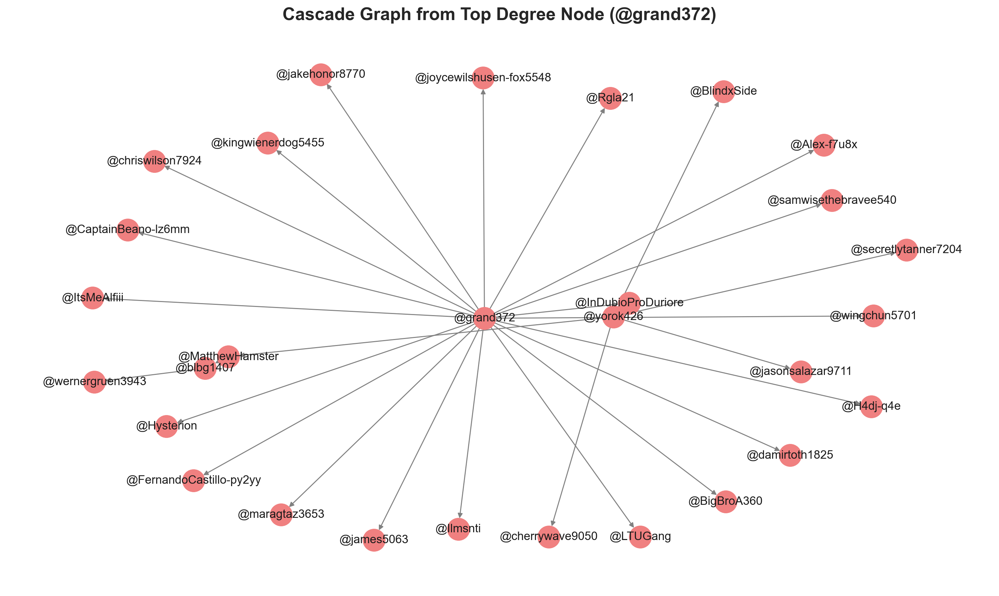

In [34]:
# Top Node with Highest Likes
steps, cascade_g_random = run_independent_cascade(G, node_of_interest, p=0.5, max_steps=10)
if isinstance(cascade_g_random, nx.Graph) and cascade_g_random.number_of_nodes() > 0:
    pos = nx.spring_layout(cascade_g_random, seed=42)
    nx.draw(cascade_g_random, pos, with_labels=True, node_size=500, node_color='lightcoral', edge_color='gray', arrows=True)
    plt.title(f"Cascade Graph from Top Degree Node ({node_of_interest})")
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Cascade graph is empty — no further spread from Random seed.")

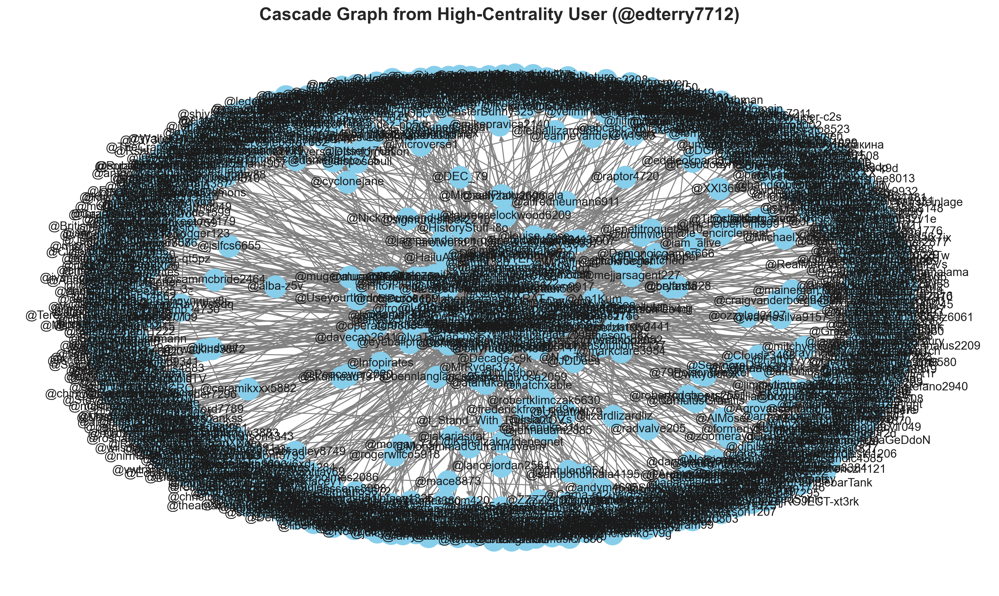

In [35]:
# Graph from High-Centrality User
steps, cascade_g = run_independent_cascade(G, high_central_node, p=0.5, max_steps=10)

if isinstance(cascade_g, nx.Graph) and cascade_g.number_of_nodes() > 0:
    pos = nx.spring_layout(cascade_g, seed=42)
    nx.draw(cascade_g, pos, with_labels=True, node_size=500, node_color='skyblue', edge_color='gray', arrows=True)
    plt.title(f"Cascade Graph from High-Centrality User ({high_central_node})")
    plt.tight_layout()
    plt.show()
else:
    print("Cascade graph is empty — no further spread from this seed.")


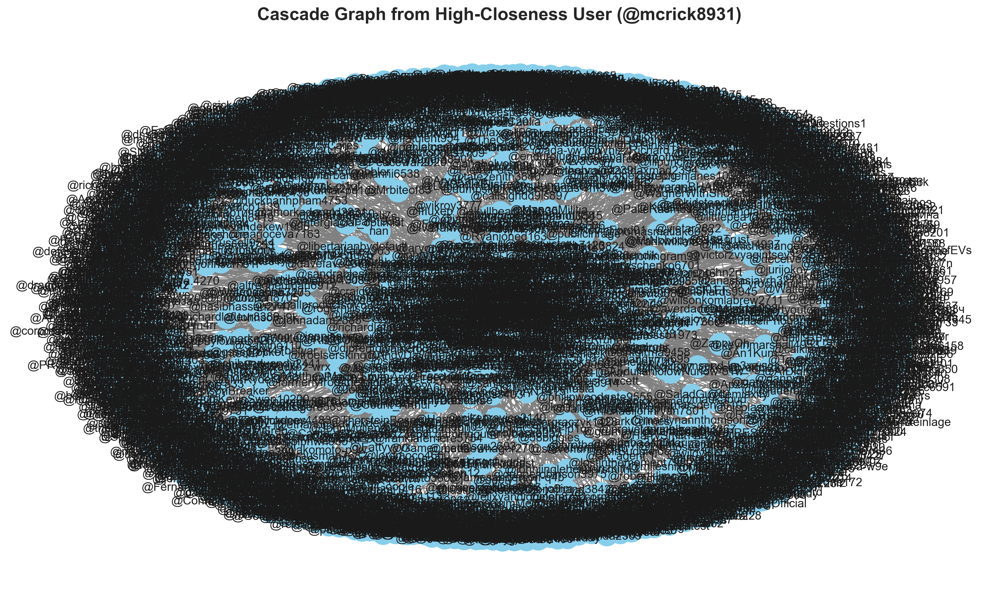

In [36]:
# Graph from High-Closeness User
steps, cascade_g = run_independent_cascade(G, high_closeness_node, p=0.5, max_steps=10)
if isinstance(cascade_g, nx.Graph) and cascade_g.number_of_nodes() > 0:
    pos = nx.spring_layout(cascade_g, seed=42)
    nx.draw(cascade_g, pos, with_labels=True, node_size=500, node_color='skyblue', edge_color='gray', arrows=True)
    plt.title(f"Cascade Graph from High-Closeness User ({high_closeness_node})")
    plt.tight_layout()
    plt.show()